In [22]:
#Importing data

from urllib.request import urlopen
from bs4 import BeautifulSoup
import pandas as pd

year = 2021

url = "https://www.basketball-reference.com/leagues/NBA_{}_per_game.html".format(year)
html = urlopen(url)

soup = BeautifulSoup(html, "html.parser")
soup.findAll('tr', limit=2)
headers = [th.getText() for th in soup.findAll('tr', limit=2)[0].findAll('th')]
headers = headers[1:]
headers
rows = soup.findAll('tr')[1:]
player_stats = [[td.getText() for td in rows[i].findAll('td')]
            for i in range(len(rows))]
stats = pd.DataFrame(player_stats, columns = headers)
stats.head(10)
stats.to_csv('stats2021.csv')

#Thank you Oscar Sanchez at towardsdatascience.com for the webscraping tutorial.

In [ ]:
def 

In [3]:
pip install pandas-profiling[notebook]

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: kiwisolver>=1.0.1 in c:\users\patri\anaconda3\lib\site-packages (from matplotlib>=3.2.0->pandas-profiling[notebook]) (1.2.0)



In [23]:
#Loading data and libraries

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors
import numpy as np
import seaborn as sns
import pandas_profiling as pp
import scipy
from scipy import stats
from pylab import rcParams

rawdf = pd.read_csv('stats2021.csv')
df = pd.DataFrame(rawdf, columns=['Player', 'Pos', 'Tm', 'MP', 'FG%', 'FGA','3PA', '3P%', '2PA', '2P%', 'eFG%', 'FT', 'FTA','PTS'])

NBA_df = df.dropna(axis=0)
print(NBA_df)




                Player Pos   Tm    MP    FG%   FGA  3PA    3P%   2PA    2P%  \
1         Jaylen Adams  PG  MIL   2.6  0.125   1.1  0.3  0.000   0.9  0.167   
2         Steven Adams   C  NOP  27.8  0.615   5.7  0.0  0.000   5.6  0.618   
3          Bam Adebayo   C  MIA  33.9  0.563  12.7  0.2  0.333  12.5  0.567   
4    LaMarcus Aldridge   C  SAS  25.9  0.464  11.8  3.6  0.360   8.2  0.509   
5    Ty-Shon Alexander  SG  PHO   2.7  0.000   1.0  0.3  0.000   0.7  0.000   
..                 ...  ..  ...   ...    ...   ...  ...    ...   ...    ...   
531       Delon Wright  SG  DET  29.2  0.468   8.1  2.5  0.384   5.6  0.506   
532     Thaddeus Young  PF  CHI  25.3  0.609   9.1  0.7  0.227   8.4  0.643   
533         Trae Young  PG  ATL  34.8  0.430  17.9  6.6  0.378  11.3  0.460   
534        Cody Zeller   C  CHO  23.4  0.514   7.9  1.1  0.158   6.8  0.569   
535        Ivica Zubac   C  LAC  19.8  0.659   4.8  0.0  0.000   4.8  0.663   

      eFG%   FT  FTA   PTS  
1    0.125  0.0  0.0  

Describe what the 5 variables mean in the dataset:

In the case of my data there is more than 5 variables in order to analyze the Shooting Statistics of NBA players. 

We have Player, Position and Team which are categorical variables for identifying players or team which experience certain trends.

MP is equal to minutes played which is the minutes played by a player on a certain team.

FG% is the Field Goal percentage of a player which is the percent of shots a player takes which go in. 

FGA is field goal attempts which is the amount of shot attempts a player puts up in a game.

%3P, 2P%, 3PA and 2PA follow the same rules as above except for 3 point and 2 point attempts.

eFG% is effecting field goal percentage which is measured by (2pt FGM + 1.5*3pt FGM) / FGA) and measures the total field goal percentage with a higher weight to 3pt makes. 

FT is free throws made per game and FTA is the Free Throw Attempts. 

Finally PTS is the average Points scored in a game. 



In [5]:
import pandas_profiling as pp
profile = pp.ProfileReport(NBA_df, title='Pandas Profiling Report', explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
#Exporting the profile report to a file:
profile.to_file("Pandas Profiling Report - NBA Shooter Stats.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

The Pandas Profiling package allows us to generate advanced statistics of our dataset without the use of other codes but for the sake of this study I will get a closer look at some of our variables. 

Histograms: 

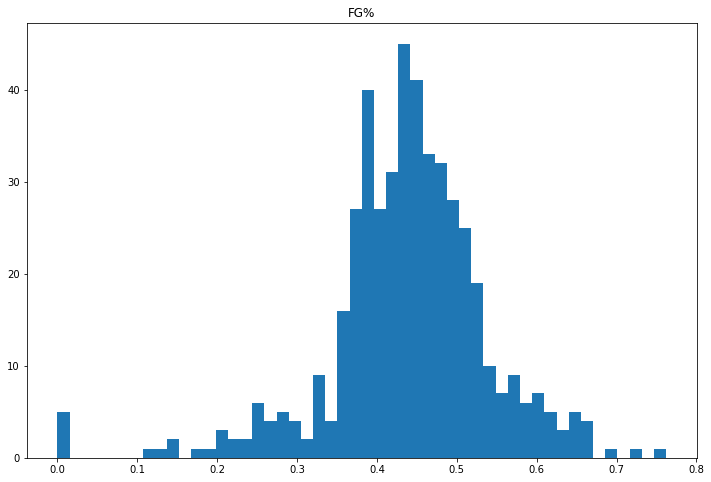

In [16]:
#Field Goal% Histogram

fgpercentagehist = NBA_df.hist(column='FG%', bins=50, grid=False, figsize=(12,8))

Minimum: 0
Maximum .762
Mean: .438
Skewed to the Right
We see outliers with players who make 0% of their shots as well as players who make above 70% of their shots. There are low volume shooters who have not made many shot attempts, so their numbers are highly skewed in one direction, 


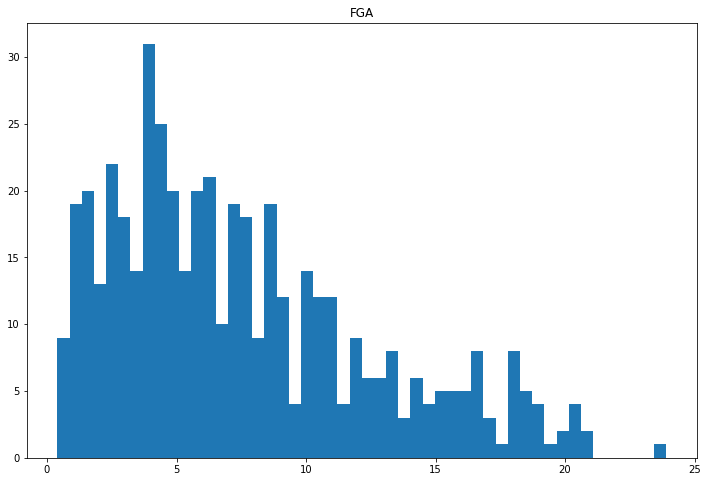

In [17]:
#Field Goal Attempts Histogram

fgahist = NBA_df.hist(column='FGA', bins=50, grid=False, figsize=(12,8))

Mean: 7.49
Maximum: 23.8
Minimum 0.4
Skewed to the left. 
We see a few outliers in players who take above 20 shots per game, this is normal as 'Star Players' on lower tier teams tend to have more oppurtunities for field goal attempts. 

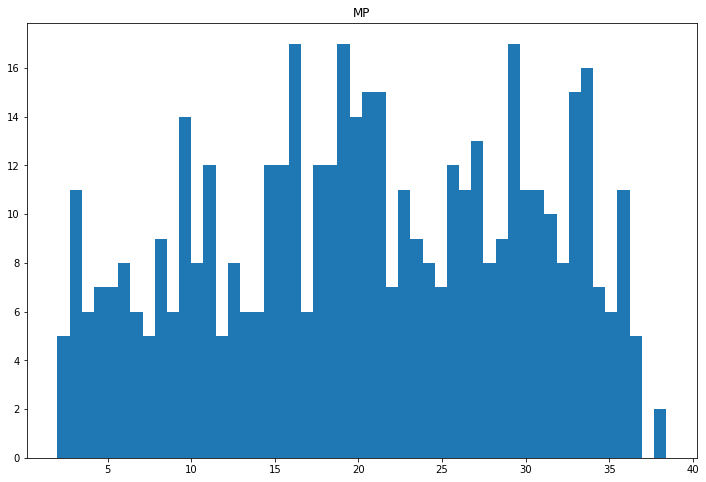

In [18]:
#Minutes played Histogram

MPhist = NBA_df.hist(column='MP', bins=50, grid=False, figsize=(12,8))

Mean: 20.49
Maximum: 38.4
Minimum: 2
Skewed slightly to the right.
Data is distributed pretty evenly with no immediate outliers. We see some players who have an increased minutes player per game which is expected as some players are required to be out on the court for extended periods as compared to the rest of the team in order to apply maximum influence within a game. Seems to be distributed pretty evenly with no evident tails of the data. 

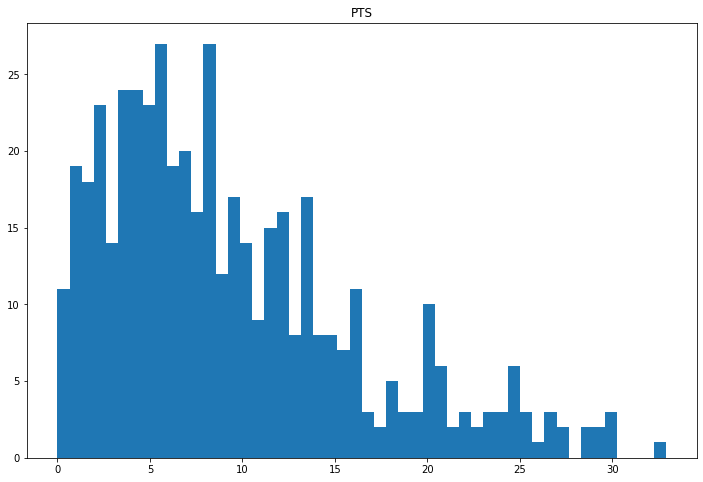

In [19]:
#Points Scored Histogram

PTShist = NBA_df.hist(column='PTS', bins=50, grid=False, figsize=(12,8))

Mean 9.38
Minimum 0
Maximum 32.9
Skewed to the left with multiple clusters with decreasing counts as the value of Points Scored per game increase. 

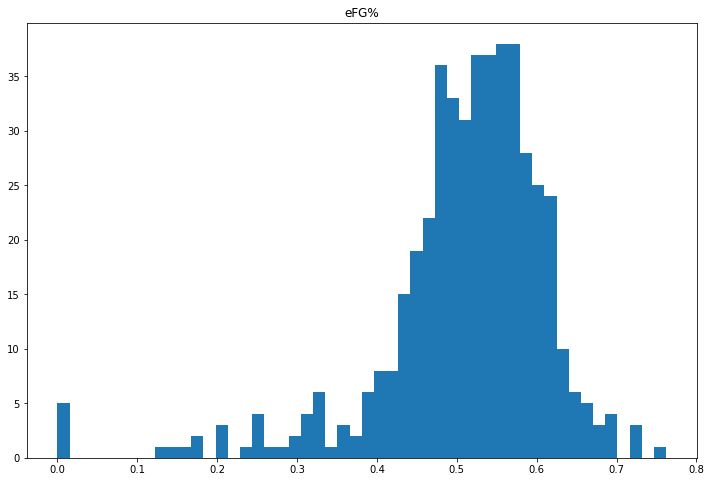

In [20]:
#EFG Percentage Histogram

EFGhist = NBA_df.hist(column='eFG%', bins=50, grid=False, figsize=(12,8))

Mean .511
Maximum .762
Minimum 0
The data seems to be clustered around mean which quickly drops off as the eFG% drops. The data is skewed slightly to the right. 

Probability Mass Function

In [21]:
import thinkstats2
import thinkplot

#Subsetting data by Position

PGdf = NBA_df[NBA_df.Pos == 'PG']
SGdf = NBA_df[NBA_df.Pos == 'SG']
SFdf = NBA_df[NBA_df.Pos == 'SF']
PFdf = NBA_df[NBA_df.Pos == 'PF']
Cdf = NBA_df[NBA_df.Pos == 'C']

PGpmf = thinkstats2.Pmf(PGdf.PTS, label = 'Point Guard')
SGpmf = thinkstats2.Pmf(SGdf.PTS, label = 'Shooting Guard')
SFpmf = thinkstats2.Pmf(SFdf.PTS, label = 'Small Forward')
PFpmf = thinkstats2.Pmf(PFdf.PTS, label = 'Power Forward')
Cpmf = thinkstats2.Pmf(Cdf.PTS, label = 'Center')

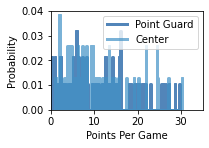

<Figure size 576x432 with 0 Axes>

In [43]:
thinkplot.PrePlot(2)
thinkplot.SubPlot(2, 2, 2)
thinkplot.Pmfs([PGpmf, Cpmf])
thinkplot.Show(xlabel='Points Per Game',
               ylabel= 'Probability',
              axis=[0,35,0,.04])        

Here we see a distribution of the probabilities for Points Per Game dependent on the position of a Point Guard (Dark Blue) and Center (Light Blue), this is an interesting distribution to look at as these two positions have the largest gaps in heights between all positions. Point Guards tend to be the shortest position in the NBA as centers tend to be the Largest.

Cumulative Distribution Function

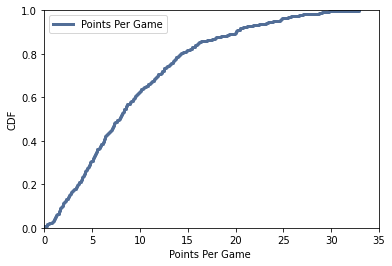

<Figure size 576x432 with 0 Axes>

In [26]:
cdf = thinkstats2.Cdf(NBA_df.PTS, label = 'Points Per Game')
thinkplot.Cdf(cdf)
thinkplot.Show(xlabel = 'Points Per Game ',
              ylabel = 'CDF', 
              axis = [0,35,0,1.0])

The Shape of our distribution of Percentiles shows that the more points you score per game, the higher the percentile you land in. About 80% of players score below around 16 points per game and scoring about 20 per game puts you in the 90% percentile.

Analytical Distribution: Complementary Cumulative Distribution Function

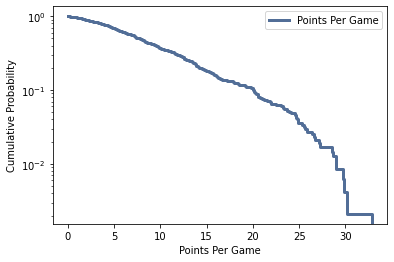

<Figure size 576x432 with 0 Axes>

In [27]:

thinkplot.Cdf(cdf,complement=True)
thinkplot.Show(xlabel='Points Per Game',
              ylabel='Cumulative Probability',
              yscale='log')

So the CCDF values are equal to 1-CDF values.  This shows us the peak values of our distribution of Points per Game. At any point in this graph it shows the percentage it is at or above that value. The CCDF curve moves towards the right so that Points per Game ratio increases which means that it shows the percentage of players which reach a certain threshold for Points per Game. 

Comparing Variables

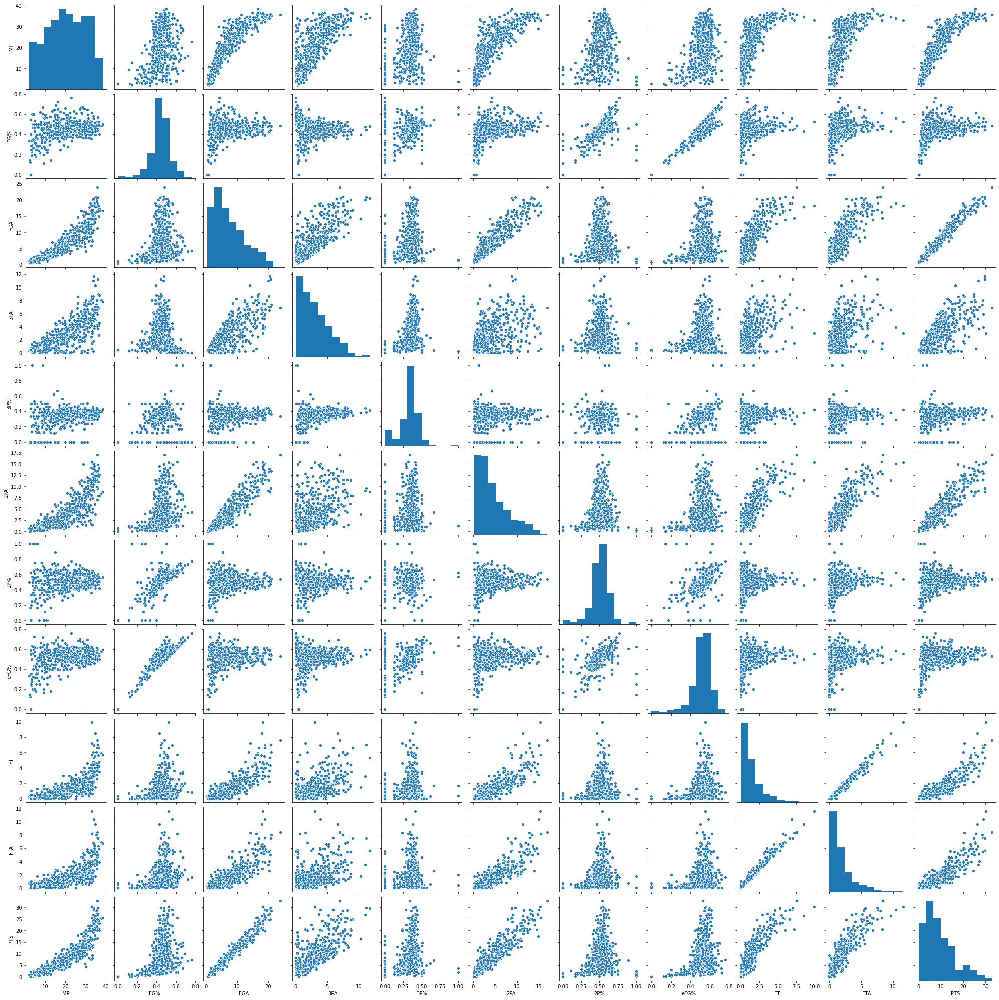

In [28]:
#First lets get a Scatter Plot Matrix of our Data

sns.pairplot(NBA_df)

The Scatter Plot variables that I am interested in is PTS with MP%, and eFG% with FGA.

No handles with labels found to put in legend.


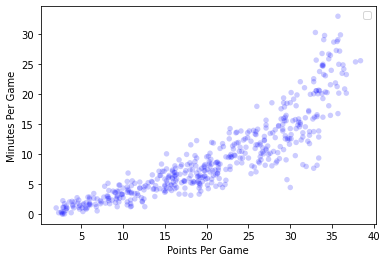

<Figure size 576x432 with 0 Axes>

In [29]:
thinkplot.scatter(NBA_df.MP, NBA_df.PTS)
thinkplot.show(xlabel = 'Points Per Game', 
              ylabel= 'Minutes Per Game')

In [30]:
PTS=NBA_df['PTS']
MP=NBA_df['MP']

stats.pearsonr_coefficient, ptsmpp_value=stats.pearsonr(PTS,MP)
print ('PearsonR Correlation Coefficient %0.3f' % (stats.pearsonr_coefficient))


PearsonR Correlation Coefficient 0.876


Points Per game are Highly Correlated with Minutes Played Per Game, the relationship seems exponential.

Now lets do the same thing for eFG% and FGA:

No handles with labels found to put in legend.


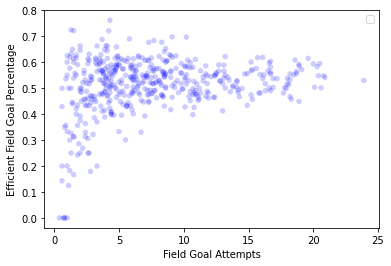

<Figure size 576x432 with 0 Axes>

In [31]:
thinkplot.scatter(NBA_df.FGA, NBA_df['eFG%'])
thinkplot.show(xlabel = 'Field Goal Attempts', 
              ylabel= 'Efficient Field Goal Percentage')

In [32]:
eFG=NBA_df['eFG%']
FGA=NBA_df['FGA']
stats.pearsonr_coefficient, ptsefgp_value=stats.pearsonr(FGA,eFG)
print ('PearsonR Correlation Coefficient %0.3f' % (stats.pearsonr_coefficient))

PearsonR Correlation Coefficient 0.248


Efficient Field Goal Percentages are only about 25% correlated with Field Goal Attempts. The relationship looks similar to a y=√x graph.

Hypothesis Testing

Let us Conduct a Spearmans's Rank Hypothesis test on the Relationship between Points per Game and Minutes Played per Game. For our null hypothesis we will say that our two samples are independent.  

In [33]:
pvalue = stats.spearmanr(PTS, MP)
print(pvalue)

SpearmanrResult(correlation=0.9309145925304356, pvalue=4.93241676522825e-209)


So our P value is <0.05 which means that there is probably dependency between the samples. 

Regression:

For this final step, we will conduct a regression analysis between points scored per game as our dependent variable and MP, FGA, and FTA as our dependent variables. 

In [34]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [35]:
model=smf.ols('PTS~MP+FGA+FTA',NBA_df).fit()

In [36]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    PTS   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     6921.
Date:                Sat, 06 Mar 2021   Prob (F-statistic):               0.00
Time:                        12:05:17   Log-Likelihood:                -683.09
No. Observations:                 475   AIC:                             1374.
Df Residuals:                     471   BIC:                             1391.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.6753      0.120     -5.621      0.000      -0.911      -0.439
MP             0.0476      0.011      4.496      0.000       0.027       0.068
FGA            0.9816      0.024     40.275      0.000       0.934       1.029
FTA            0.9229      0.045     20.388      0.000       0.834       1.012
==============================================================================
Omnibus:                       17.870   Durbin-Watson:                   1.875
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               38.907
Skew:                          -0.133   Prob(JB):                     3.56e-09
Kurtosis:                       4.377   Cond. No.                         62.6
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

R2 value of 98 percent means that our model fits the data very well. 
F statistic of 6921 and F-Statistic probability of 0.00 tells us that we can reject the null hypothesis that a Intercept Only Model will be a better fit then our regression and that there is a relationship between MP, FGA, and FTA. 
Now lets look at what features are significant. All of our predictor variables have a P value of <0.05, which means that all these variables are significant in determining how many points a player scores per game. The weight values of these particular features are non zero. 